<a href="https://colab.research.google.com/github/iamkzntsv/neural-style-transfer/blob/main/Neural_Style_Transfer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Art Generation with Neural Style Transfer
---

In [ ]:
# Imports
import os
import sys
import numpy as np
import tensorflow as tf
import cv2
from PIL import Image
import matplotlib.pyplot as plt
import urllib
from PIL import Image
from io import BytesIO
import sklearn.metrics

## Cost Function

### Content Cost

In [ ]:
def compute_content_cost(a_C, a_G):
    """
    Compute the content cost (how different two activations are)
    
    Parameters:
    ----------
    a_C : tensor of shape (1, m, n_H, n_W, n_C)
        hidden layer activations representing content of the image C.
    a_G : tensor of shape (1, m, n_H, n_W, n_C)
        hidden layer activations representing content of the image G.
    
    Returns:
    ------- 
    J_content : scalar 
        computed cost.
    """
    # Retrieve (m, n_H, n_W, n_C) shape tensors (output from the content computing layer)
    a_C = a_C[-1]
    a_G = a_G[-1]
    
    # Retrieve dimensions from a_G
    m, n_H, n_W, n_C = a_G.shape
    
    # Compute cost
    J_content = (1/(4*n_H*n_W*n_C)) * tf.reduce_sum(tf.square(a_C - a_G))
    
    return J_content

### Style Cost

In [ ]:
def gram_matrix(A):
    """
    Compute gram matrix

    Parameters:
    ----------
    A : tensor of shape (n_C, n_H*n_W)
        a matrix of feature vectors from layer activation.
    
    Returns:
    -------
    GA : tensor of shape (n_C, n_C)
        gram matrix of A.
    """  
    GA = tf.linalg.matmul(A, tf.transpose(A)) 

    return GA

In [ ]:
def compute_layer_style_cost(a_S, a_G):
    """
    Compute the style cost for a single layer (how different two correlation maps are).
    
    Parameters:
    ----------
    a_S : tensor of shape (m, n_H, n_W, n_C)
        hidden layer activations representing content of the image S.
    a_G : tensor of shape (m, n_H, n_W, n_C)
        hidden layer activations representing content of the image G.
    
    Returns:
    ------- 
    J_style : scalar 
        computed cost.
    """
    # Retrieve dimensions from a_G
    m, n_H, n_W, n_C = a_G.get_shape().as_list()
    
    # Reshape the images from (n_H * n_W, n_C) to (n_C, n_H * n_W)
    a_S = tf.transpose(tf.reshape(a_S, shape=[-1, n_C]))
    a_G = tf.transpose(tf.reshape(a_G, shape=[-1, n_C]))

    # Computing gram_matrices for both images
    GS = gram_matrix(a_S)
    GG = gram_matrix(a_G)

    # Compute the loss
    J_style_layer = tf.reduce_sum(tf.square(GS - GG)) / (4*(n_C*n_H*n_W)**2)
    
    return J_style_layer

In [ ]:
def compute_style_cost(style_image_output, generated_image_output, style_layers):
    """
    Compute overall style cost.
    
    Parameters:
    ----------
    style_image_output :
    generated_image_output : 
    style_layers : a python list containing:
                      - the names of the layers we would like to extract style from
                      - a coefficient for each of them
    
    Returns:
    ------- 
    J_style : tensor representing a scalar value
       style cost over all layers.
    """
    
    # Initialize the overall style cost
    J_style = 0

    # Set a_S to be the hidden layer activation from the layer we have selected.
    # The last element of the array contains the content layer image, which must not be used.
    a_S = style_image_output[:-1]

    # Set a_G to be the output of the choosen hidden layers.
    # The last element of the list contains the content layer image which must not be used.
    a_G = generated_image_output[:-1]

    for i, weight in zip(range(len(a_S)), style_layers):  
        # Compute style cost for the current layer
        J_style_layer = compute_layer_style_cost(a_S[i], a_G[i])

        # Add weight * J_style_layer of this layer to overall style cost
        J_style += weight[1] * J_style_layer

    return J_style

### Total Cost

In [ ]:
@tf.function()
def total_cost(J_content, J_style, alpha = 10, beta = 40):
    """
    Compute the total cost
    
    Parameters:
    ----------
    J_content : a scalar
         content cost
    J_style : a scalar
         style cost
    alpha : a scalar
         hyperparameter weighting the importance of the content cost
    beta : a scalar
         hyperparameter weighting the importance of the style cost
    
    Returns:
    -------
    J : a scalar
        total cost.
    """
    J = alpha * J_content + beta * J_style
    return J


## Solving the Optimization Problem

### Loading Images

Content image shape: (1, 400, 400, 3)
Style image shape: (1, 400, 400, 3)


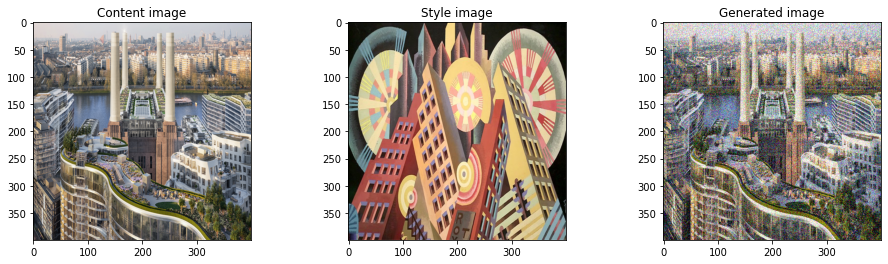

In [ ]:
IMG_SIZE = (400,400)

def load_img_from_url(url):
    try:
        f = urllib.request.urlopen(url) # load image
        jpeg_str = f.read()
        pic = Image.open(BytesIO(jpeg_str)).resize((IMG_SIZE)) # decode to PIL Image and resize
        img = np.array(pic) # convert to numpy format
        return img
    except IOError:
        print("Cannot retrieve the image. Please check the url.") 
        return

def preprocess_img(_img):
    # Scale pixel values to 0-1 range
    _img = _img.astype(np.float32)/255
    # Lower resolution
    _img = cv2.resize(_img, dsize=(96, 96), interpolation=cv2.INTER_CUBIC)
    return _img

# Load content image
content_image = load_img_from_url('https://www.lda-design.co.uk/wp-content/uploads/BPS_RoofTerrace_BatterseaRoofGardens_1338x749.jpg')
content_image = tf.constant(np.reshape(content_image, ((1,) + content_image.shape)))
print(f"Content image shape: {content_image.shape}")

# Load style image
style_image = load_img_from_url('https://i.ytimg.com/vi/WAWjiWqPYR0/maxresdefault.jpg') 
style_image = tf.constant(np.reshape(style_image, ((1,) + style_image.shape)))
print(f"Style image shape: {style_image.shape}")

# Initialize the generated image as a noisy image slightly corelated with the content image, 
# this will help the content of both images to match more rapidly.
generated_image = tf.Variable(tf.image.convert_image_dtype(content_image, tf.float32))
noise = tf.random.uniform(tf.shape(generated_image), -0.25, 0.25)
generated_image = tf.add(generated_image, noise)
generated_image = tf.clip_by_value(generated_image, clip_value_min=0.0, clip_value_max=1.0)
generated_image = tf.Variable(generated_image)

# Show the 3 images in a row
fig = plt.figure(figsize=(16, 4))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(content_image[0])
ax.title.set_text('Content image')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(style_image[0])
ax.title.set_text('Style image')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(generated_image[0])
ax.title.set_text('Generated image')

plt.savefig("inital.png")
plt.show()

### Loading Pretrained Model

In [ ]:
INPUT_SHAPE = IMG_SIZE + (3,)

# Load pretrained VGG model
vgg = tf.keras.applications.VGG19(include_top=False,
                                  input_shape=(INPUT_SHAPE),
                                  weights='imagenet')

vgg.trainable = False

In [ ]:
for layer in vgg.layers:
    print(layer.name)

input_2
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_conv4
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_conv4
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_conv4
block5_pool


In [ ]:
def get_layer_outputs(vgg, layer_names):
    """
    Create a vgg model that will return a list of intermediate outputs values for the middle layers

    Parameters:
    ----------
    vgg : keras model
        trained vgg model
    layer_names : a list of tuples where:
        - the first element is the layer name
        - the second element is the weight for that layer
    
    Returns:
    model with multiple outputs (for each layer in layer_names)
    -------
    """
    outputs = [vgg.get_layer(layer[0]).output for layer in layer_names]
    model = tf.keras.Model(vgg.input, outputs)

    return model

In [ ]:
# Define layer for computing content cost and its weight
CONTENT_LAYER = [('block5_conv4', 1)]

# Define layers and their weights for computing style cost
STYLE_LAYERS = [
    ('block1_conv1', 0.2),
    ('block2_conv1', 0.2),
    ('block3_conv1', 0.2),
    ('block4_conv1', 0.2),
    ('block5_conv1', 0.2)]

# Build the model
vgg_model_outputs = get_layer_outputs(vgg, STYLE_LAYERS + CONTENT_LAYER)

### Preprocessing

In [ ]:
preprocessed_content = tf.Variable(tf.image.convert_image_dtype(content_image, tf.float32))
a_C = vgg_model_outputs(preprocessed_content)

preprocessed_style = tf.Variable(tf.image.convert_image_dtype(style_image, tf.float32))
a_S = vgg_model_outputs(preprocessed_style)

In [ ]:
# Utils to display the images generated by the model
def clip_0_1(image):
    """
    Truncate all the pixels in the tensor to be between 0 and 1
    
    Parameters:
    ----------
    image : tensor
    J_style : scalar
        style cost

    Returns:
    -------
    tensor
    """
    return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

def tensor_to_image(tensor):
    """
    Converts the given tensor into a PIL image
    
    Parameters:
    ----------
    tensor : tensor
    
    Returns:
    -------
    Image: a PIL image
    """
    tensor = tensor * 255
    tensor = np.array(tensor, dtype=np.uint8)
    if np.ndim(tensor) > 3:
        assert tensor.shape[0] == 1
        tensor = tensor[0]
    return Image.fromarray(tensor)

### Training the Model

In [ ]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)

@tf.function()
def train_step(G):
    """
    Perform a single training step.

    Parameters:
    ----------
    G : tensor
        generated image.

    Returns:
    -------
    total cost.
    """

    with tf.GradientTape() as tape:
        
        # Compute model output for the current generated image
        a_G = vgg_model_outputs(G) 

        # Compute the content cost
        J_content = compute_content_cost(a_C, a_G)
        
        # Compute the style cost
        J_style = compute_style_cost(a_S, a_G, STYLE_LAYERS)

        # Compute the total cost
        J = total_cost(J_content, J_style)
        
    # Compute gradients
    grad = tape.gradient(J, G)

    # Update a_G
    optimizer.apply_gradients([(grad, G)])
    G.assign(clip_0_1(G))

    return J


mkdir: cannot create directory ‘images’: File exists
Epoch 0 


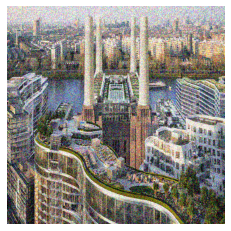

Epoch 250 


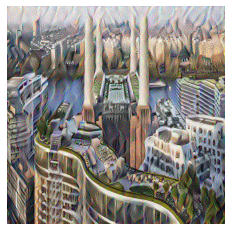

Epoch 500 


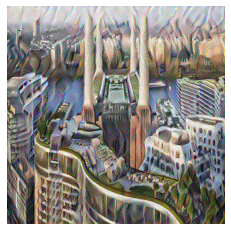

Epoch 750 


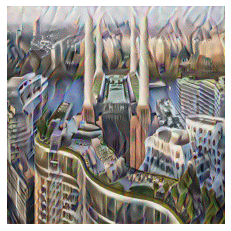

Epoch 1000 


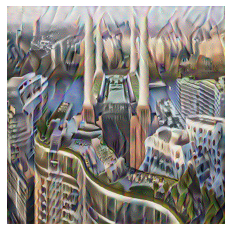

Epoch 1250 


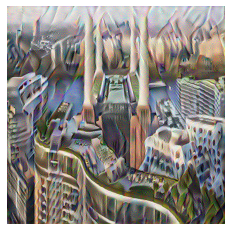

Epoch 1500 


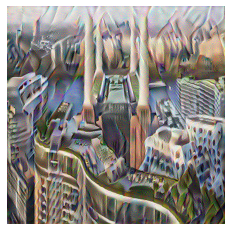

Epoch 1750 


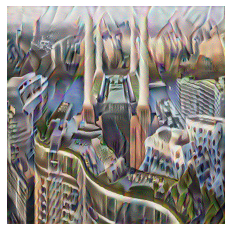

Epoch 2000 


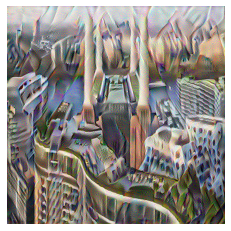

Epoch 2250 


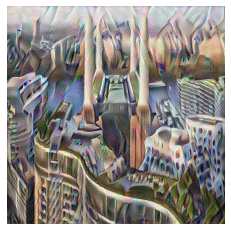

Epoch 2500 


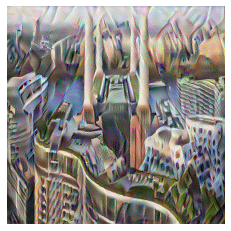

Epoch 2750 


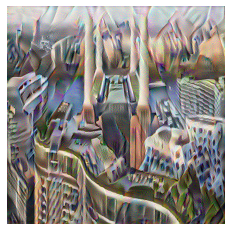

Epoch 3000 


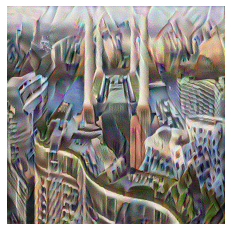

Epoch 3250 


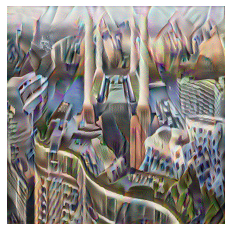

Epoch 3500 


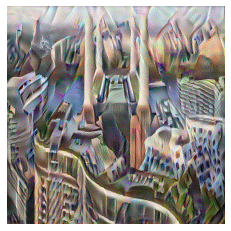

Epoch 3750 


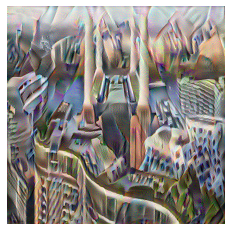

Epoch 4000 


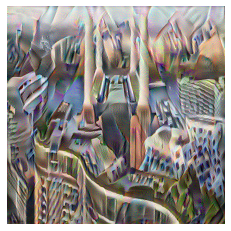

Epoch 4250 


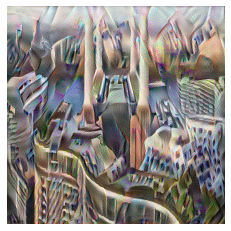

Epoch 4500 


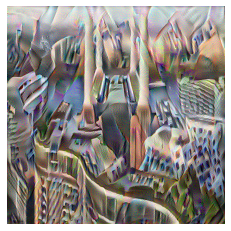

Epoch 4750 


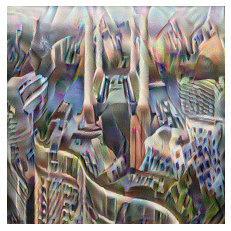

Epoch 5000 


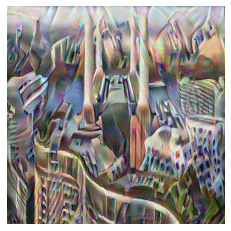

Epoch 5250 


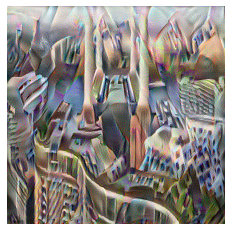

Epoch 5500 


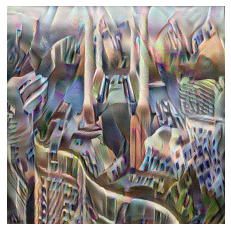

Epoch 5750 


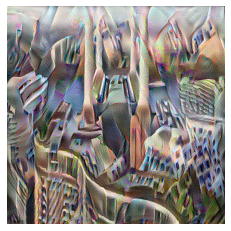

Epoch 6000 


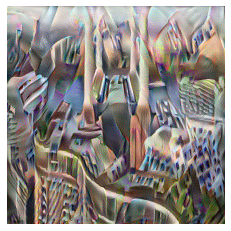

Epoch 6250 


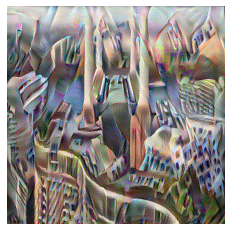

Epoch 6500 


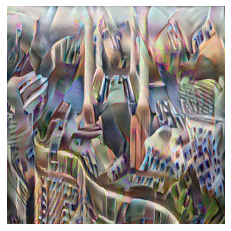

Epoch 6750 


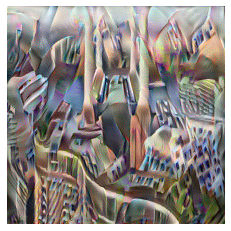

Epoch 7000 


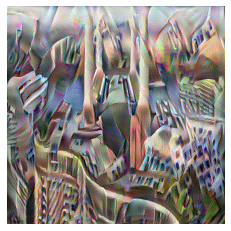

Epoch 7250 


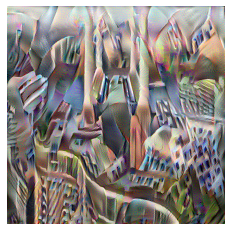

Epoch 7500 


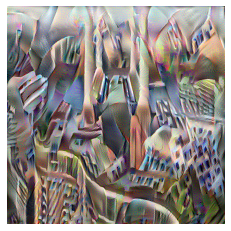

Epoch 7750 


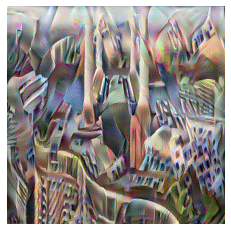

Epoch 8000 


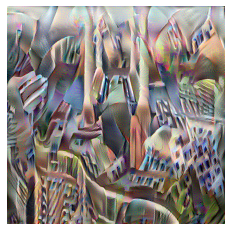

Epoch 8250 


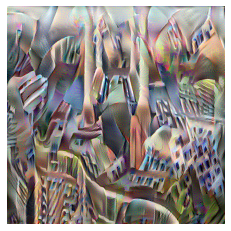

Epoch 8500 


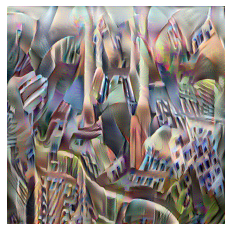

Epoch 8750 


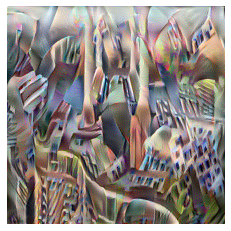

Epoch 9000 


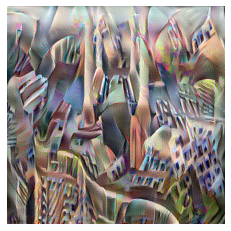

Epoch 9250 


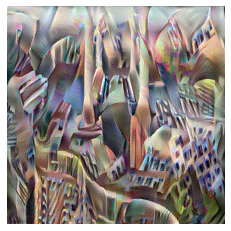

Epoch 9500 


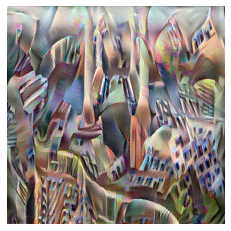

Epoch 9750 


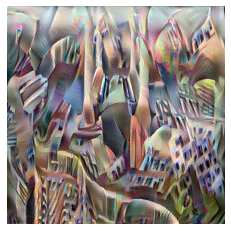

Epoch 10000 


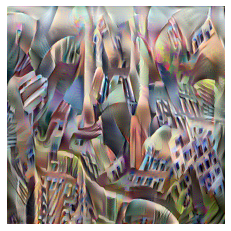

Epoch 10250 


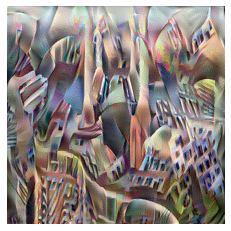

Epoch 10500 


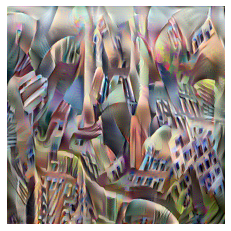

Epoch 10750 


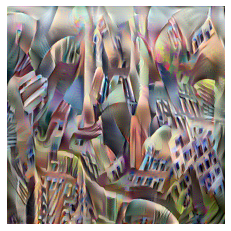

Epoch 11000 


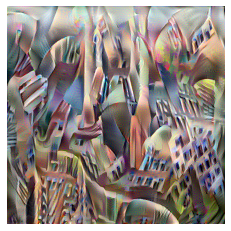

Epoch 11250 


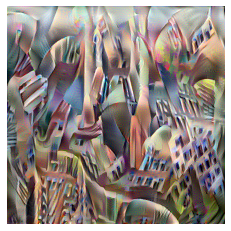

Epoch 11500 


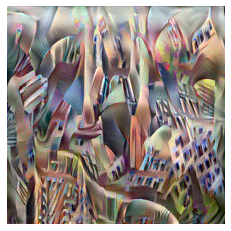

Epoch 11750 


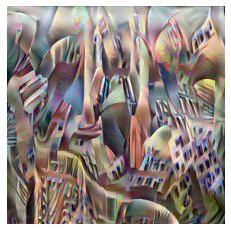

Epoch 12000 


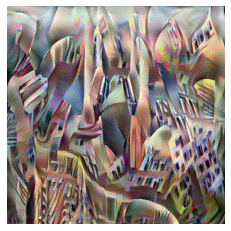

Epoch 12250 


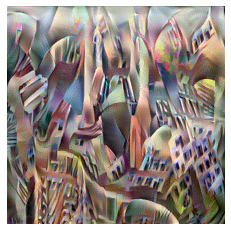

Epoch 12500 


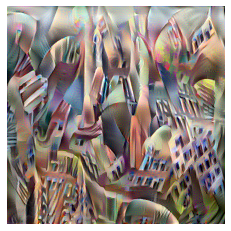

Epoch 12750 


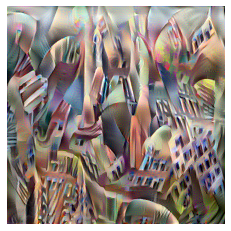

Epoch 13000 


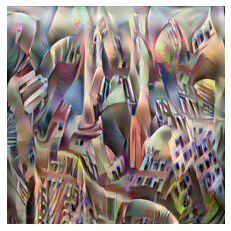

Epoch 13250 


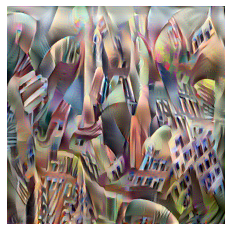

Epoch 13500 


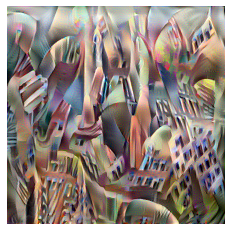

Epoch 13750 


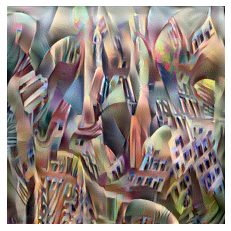

Epoch 14000 


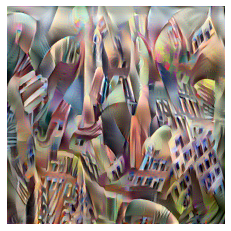

Epoch 14250 


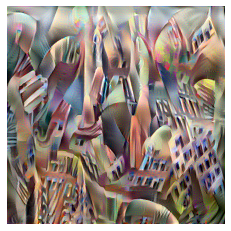

Epoch 14500 


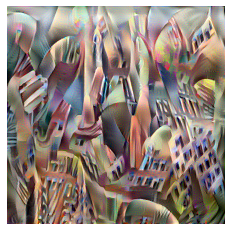

Epoch 14750 


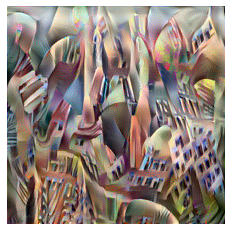

Epoch 15000 


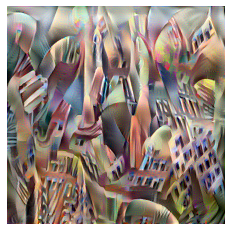

Epoch 15250 


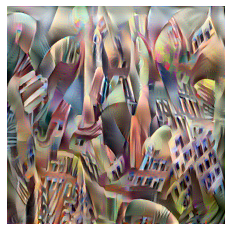

Epoch 15500 


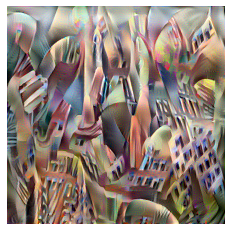

Epoch 15750 


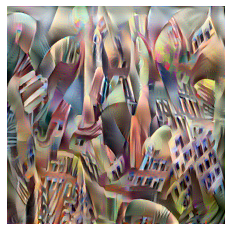

Epoch 16000 


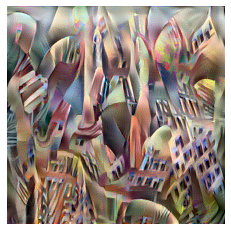

Epoch 16250 


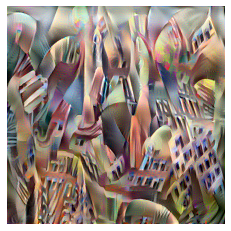

Epoch 16500 


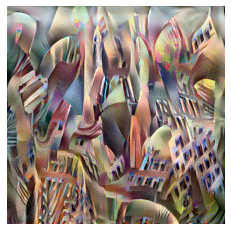

Epoch 16750 


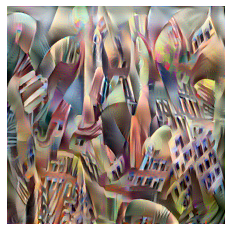

Epoch 17000 


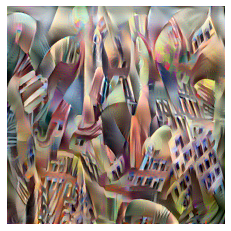

Epoch 17250 


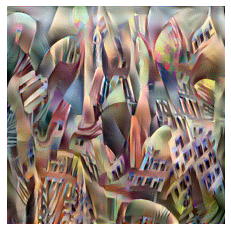

Epoch 17500 


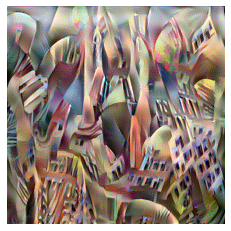

Epoch 17750 


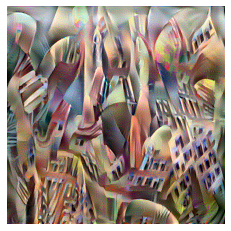

Epoch 18000 


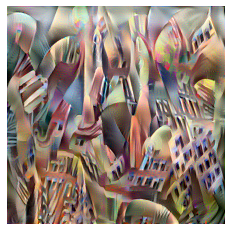

Epoch 18250 


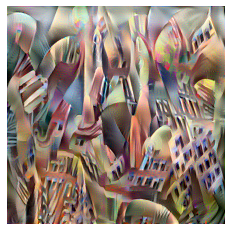

Epoch 18500 


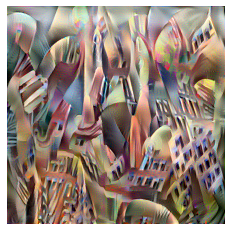

Epoch 18750 


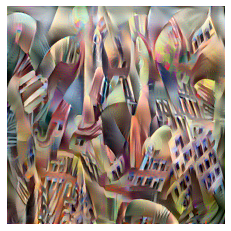

Epoch 19000 


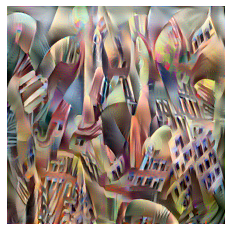

Epoch 19250 


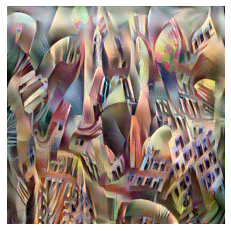

Epoch 19500 


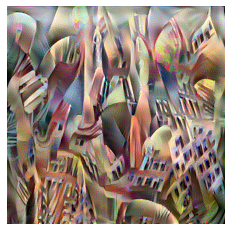

Epoch 19750 


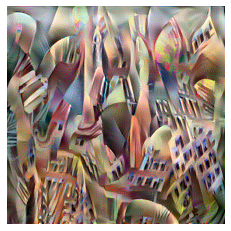

In [ ]:
!mkdir images

# Main loop
epochs = 20000
for i in range(epochs):
    train_step(generated_image)
    if i % 250 == 0:
        print(f"Epoch {i} ")
        image = tensor_to_image(generated_image)
        plt.axis('off')
        plt.imshow(image)
        plt.savefig("images/img" + str(i) + ".png")
        plt.show()

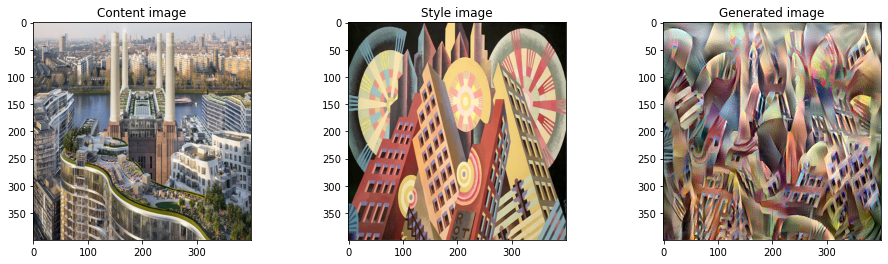

In [ ]:
# Show the 3 images in a row
fig = plt.figure(figsize=(16, 4))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(content_image[0])
ax.title.set_text('Content image')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(style_image[0])
ax.title.set_text('Style image')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(generated_image[0])
ax.title.set_text('Generated image')

plt.savefig("result.png")
plt.show()

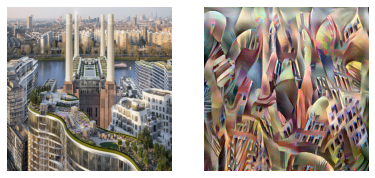

In [ ]:
# Show the 3 images in a row
fig = plt.figure(figsize=(10, 5))

ax = fig.add_subplot(1, 3, 1)
plt.axis('off')
plt.imshow(content_image[0])

ax = fig.add_subplot(1, 3, 2)
plt.axis('off')
plt.imshow(generated_image[0])

plt.savefig("comp1.png")
plt.show()